# Import libraries:

In [1]:
import numpy as np
import scipy.integrate as scpi
import matplotlib.pyplot as plt
from matplotlib import animation
plt.rc("animation", html="jshtml")

# Tests:

In [2]:
#solve_ivp(fun,t_span,y0,method='RK45',t_eval=None,dense_output=False, events=None, vectorized=False, args=None, **options)
sss=4
eee=13
scpi.solve_ivp(lambda x,y:.4*x,[sss,eee],[3],t_eval=np.linspace(sss,eee,100))

#Solve first, input solve data to animator

  message: 'The solver successfully reached the end of the integration interval.'
     nfev: 20
     njev: 0
      nlu: 0
      sol: None
   status: 0
  success: True
        t: array([ 4.        ,  4.09090909,  4.18181818,  4.27272727,  4.36363636,
        4.45454545,  4.54545455,  4.63636364,  4.72727273,  4.81818182,
        4.90909091,  5.        ,  5.09090909,  5.18181818,  5.27272727,
        5.36363636,  5.45454545,  5.54545455,  5.63636364,  5.72727273,
        5.81818182,  5.90909091,  6.        ,  6.09090909,  6.18181818,
        6.27272727,  6.36363636,  6.45454545,  6.54545455,  6.63636364,
        6.72727273,  6.81818182,  6.90909091,  7.        ,  7.09090909,
        7.18181818,  7.27272727,  7.36363636,  7.45454545,  7.54545455,
        7.63636364,  7.72727273,  7.81818182,  7.90909091,  8.        ,
        8.09090909,  8.18181818,  8.27272727,  8.36363636,  8.45454545,
        8.54545455,  8.63636364,  8.72727273,  8.81818182,  8.90909091,
        9.        ,  9.0909090

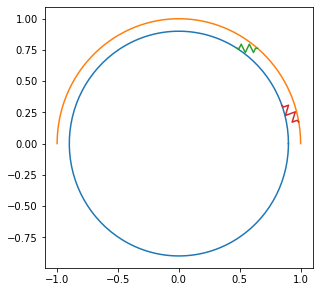

In [2]:
def drawSpring(s,e):
    d0=e[0]-s[0]
    d1=e[1]-s[1]
    plt.plot([s[0],s[0]+d0/10,s[0]+d0/5-d1/5,s[0]+d0*2/5+d1/5,s[0]+d0*3/5-d1/5,s[0]+d0*4/5+d1/5,s[0]+d0*9/10,e[0]],
             [s[1],s[1]+d1/10,s[1]+d1/5+d0/5,s[1]+d1*2/5-d0/5,s[1]+d1*3/5+d0/5,s[1]+d1*4/5-d0/5,s[1]+d1*9/10,e[1]])

obfun=lambda p,r:[np.cos(2*np.pi*(p+r))*.9, np.sin(2*np.pi*(p+r))*.9]
grfun=lambda p:[np.cos(np.pi*p), np.sin(np.pi*p)]

ls=np.linspace(0,1,200)
obp=obfun(ls,0)
grp=grfun(ls)
pf1,pa1=plt.subplots(1,1,figsize=(4.8,4.8))
plt.plot(obp[0],obp[1])
plt.plot(grp[0],grp[1])

drawSpring([obp[0][32],obp[1][32]],[grp[0][55],grp[1][55]])
drawSpring([obp[0][11],obp[1][11]],[grp[0][11],grp[1][11]])

In [ ]:
#import ctypes
#dll=ctypes.CDLL("libcip.dll")
#dll.hw.argtypes=[ctypes.c_int]
#print(dll.hw(3))

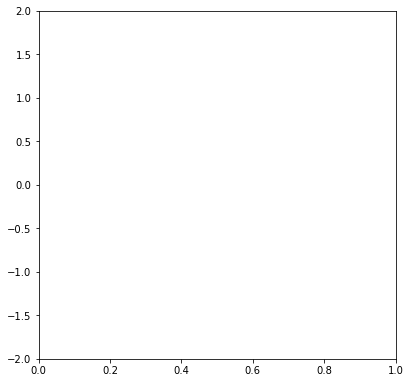

In [36]:
pf0,pa0=plt.subplots(1,1,figsize=(6.4,6.4))
pa0.set_xlim([0,1])
pa0.set_ylim([-2,2])

drwob=pa0.plot([],[], lw=2)
drwob1=pa0.plot([],[], lw=2)
drwobs=[]
ite=3
for i in range(ite):
    drwobs.extend(pa0.plot([],[], lw=2))

def aninit():
    for i in range(ite):
        drwobs[i].set_data([], [])
    #drwob[0].set_data([], [])
    #drwob1[0].set_data([], [])
    return drwobs#drwob[0],drwob1[0]
def animate(i):
    x=np.linspace(0,1,500)
    y=np.sin(x*i)
    #drwob[0].set_data(x,y)
    #drwob1[0].set_data(2*x,y/2)
    for i in range(ite):
        drwobs[i].set_data(x, y/(i+1))
    return drwobs#drwob[0],drwob1[0]
#ball=drwob[0]
#ball.set_data(40,60)
anim=animation.FuncAnimation(pf0, animate, init_func=aninit, frames=200, interval=20, blit=True)

drwobs
#print(type(drwob),type(drwob1[0]))

In [37]:
anim

# General differential equations:
$\dot{\dot{\theta}}=\frac1{I}\sum_i(\vec{x}_i-\vec{o})\times(k(\vec{x}_i-\vec{x}_{i0}))$  
$\dot{\dot{\vec{o}}}=\frac1m\left(\vec{F}_{ext}+\sum_ik(\vec{x}_i-\vec{x}_{i0})\right)$  
## Relationship between $x_i$'s, $x_{i0}$'s and $p_i$'s:
$\vec{x}_i=\vec{o}+\vec{O}(p_i,\theta)$, $\vec{x}_{i0}=\vec{O}(p_i,0)$, $o(t=0)=\vec{0}$  
$\texttt{vars:ox,oy,thz}$, $\texttt{cons:m,k,I,Fx,Fy}$   
# Specific differential equations (2D):
$\dot{\dot{\theta}}_z=\frac{k}{I}\sum_i(\vec{x}_i-\vec{o})_x\cdot(\vec{x}_i-\vec{x}_{i0})_y-(\vec{x}_i-\vec{o})_y\cdot(\vec{x}_i-\vec{x}_{i0})_x$  
$=\frac{k}{I}\sum_i(\vec{O}_x(p_i,\theta))\cdot(\vec{o}+\vec{O}(p_i,\theta)-\vec{O}(p_i,0))_y-(\vec{O}_y(p_i,\theta))\cdot(\vec{o}+\vec{O}(p_i,\theta)-\vec{O}(p_i,0))_x$  
$\dot{\dot{\vec{o}}}_x=\frac1m\left((\vec{F}_{ext})_x+\sum_ik(\vec{x}_i-\vec{x}_{i0})_x\right)=\frac1m\left((\vec{F}_{ext})_x+\sum_ik(\vec{o}_x+\vec{O}_x(p_i,\theta)-\vec{O}_x(p_i,0))\right)$  
$\dot{\dot{\vec{o}}}_y=\frac1m\left((\vec{F}_{ext})_y+\sum_ik(\vec{x}_i-\vec{x}_{i0})_y\right)=\frac1m\left((\vec{F}_{ext})_y+\sum_ik(\vec{o}_y+\vec{O}_y(p_i,\theta)-\vec{O}_y(p_i,0))_y\right)$  
make function that returns lambda containing diff.eq.

In [97]:
def getSpring(s,e):
    d0=e[0]-s[0]
    d1=e[1]-s[1]
    return([[s[0],s[0]+d0/10,s[0]+d0/5-d1/5,s[0]+d0*2/5+d1/5,s[0]+d0*3/5-d1/5,s[0]+d0*4/5+d1/5,s[0]+d0*9/10,e[0]],
             [s[1],s[1]+d1/10,s[1]+d1/5+d0/5,s[1]+d1*2/5-d0/5,s[1]+d1*3/5+d0/5,s[1]+d1*4/5-d0/5,s[1]+d1*9/10,e[1]]])
    #return([[s[0],e[0]],
             #[s[1],e[1]]])
class conf:
    def __init__(self,m=1,k=3,I=1,Fx=0,Fy=-.002,ofun=obfun):
        self.m=m
        self.k=k
        self.I=I
        self.Fx=Fx
        self.Fy=Fy
        self.ofun=ofun
        self.p=[1./6,1./3]
        self.gp=[1./3,2./3]
        self.sol=None
        self.lines=None
    def diffeq(self,t,y):
        #thz', thz, ox', ox, oy', oy
        thsum=0.0
        oxsum=0.0
        oysum=0.0
        for sp in self.p:
            Op=self.ofun(sp,y[1])
            O0=self.ofun(sp,0)
            thsum+=Op[0]*(y[5]+Op[1]-O0[1])-Op[1]*(y[3]+Op[0]-O0[0])
            oxsum+=self.k*(y[3]+Op[0]-O0[0])
            oysum+=self.k*(y[5]+Op[1]-O0[1])
        return [self.k/self.I*thsum,y[0],(self.Fx+oxsum)/self.m,y[2],(self.Fy+oysum)/self.m,y[4]]
    def solve(self,t0=0,tf=5,anframes=30):
        self.sol=scpi.solve_ivp(self.diffeq,[t0,tf],[0,0,0,0,0,0],t_eval=np.linspace(t0,tf,anframes))
        return self.sol
    #def save(self):
    def an_init(self):
        for sl in self.lines:
            sl.set_data([], [])
        return self.lines
    def an_anim(self,frame):
        ls=np.linspace(0,1,200)
        obp=obfun(ls,self.sol.y[1][frame]/(2*np.pi))
        
        self.lines[0].set_data(obp[0]+self.sol.y[3][frame], obp[1]+self.sol.y[5][frame])
        rotmarkx=[self.sol.y[3][frame],self.sol.y[3][frame]+obp[0][0]]
        rotmarky=[self.sol.y[5][frame],self.sol.y[5][frame]+obp[1][0]]
        self.lines[1].set_data(rotmarkx,rotmarky)
        for sl in zip(self.lines[2:],self.p,self.gp):
            s=grfun(sl[2])
            e=obfun(sl[1],self.sol.y[1][frame]/(2*np.pi))
            e[0]+=self.sol.y[3][frame]
            e[1]+=self.sol.y[5][frame]
            sprspr=getSpring(s,e)#[[s[0],e[0]],[s[1],e[1]]]
            sl[0].set_data(sprspr[0], sprspr[1])
        return self.lines
    def ani(self,fig=None,ax=None):#tro på os to #,a_init,a_anim
        if(fig==None or ax==None):
            fig,ax=plt.subplots(1,1,figsize=(6.4,6.4))
        ax.set_xlim([-4,4])
        ax.set_ylim([-4,4])
        ls=np.linspace(0,1,200)
        grp=grfun(ls)
        ax.plot(grp[0],grp[1])
        
        self.lines=[]
        self.lines.extend(ax.plot([],[], lw=2))#object
        self.lines.extend(ax.plot([],[], lw=2))#rotation marker
        for i in self.p:
            self.lines.extend(ax.plot([],[], lw=2))
        anim=animation.FuncAnimation(fig, self.an_anim, init_func=self.an_init, frames=self.sol.y.shape[1], interval=100, blit=True)
        return anim

In [100]:
su0=conf()
su0.solve(0,8,200)
#su0.ani
print("")

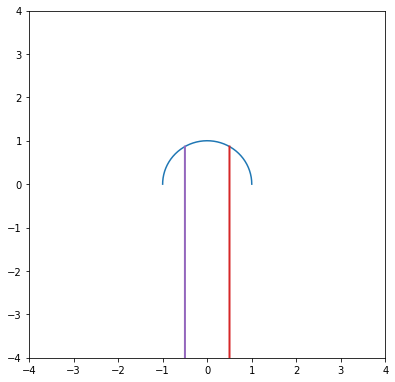

In [101]:
su0.ani()